## Model Evaluation

In [1]:
import numpy as np
import pandas as pd
import os
import librosa
import seaborn as sns
import matplotlib.pyplot as plt
import IPython.display as ipd

from IPython.display import Image
from sklearn.metrics import confusion_matrix
from reporting_functions import (
    confusion_matrix_stats,
    plot_confusion_matrix_nn,
    get_tp_tn_lists,
    plot_loss,
    get_result_table,
    gather_experiment_results,
    gather_results_deprecated,
    get_file_content,
    get_result_table_target_pairs,
)

from circuit_presets import (
    filter_embedding_options,
    EMBEDDING_OPTIONS,
    CIRCUIT_OPTIONS,
    POOLING_OPTIONS,
)

In [2]:
# Use 3 decimal places in output display
pd.set_option("display.precision", 3)

# Don't wrap repr(DataFrame) across additional lines
pd.set_option("display.expand_frame_repr", False)

# Set max rows displayed in output to 25
pd.set_option("display.max_rows", 25)

In [3]:
experiments_path = "../experiments"
experiment_filename = "experiment_config.json"  # "experiment.txt"
experiment_time = "experiment_time.json"

In [4]:
experiment_id = 23
experiment_info = get_file_content(
    f"{experiments_path}/{experiment_id}/{experiment_filename}"
)
experiment_time_info = get_file_content(
    f"{experiments_path}/{experiment_id}/{experiment_time}"
)
result_data = gather_experiment_results(f"{experiments_path}/{experiment_id}")

In [5]:
print(experiment_info)

{
    "ID": 23,
    "path": "../experiments",
    "data": {
        "target_pairs": [
            [
                "blues",
                "classical"
            ],
            [
                "blues",
                "country"
            ],
            [
                "blues",
                "disco"
            ],
            [
                "blues",
                "hiphop"
            ],
            [
                "blues",
                "jazz"
            ],
            [
                "blues",
                "metal"
            ],
            [
                "blues",
                "pop"
            ],
            [
                "blues",
                "reggae"
            ],
            [
                "blues",
                "rock"
            ],
            [
                "classical",
                "country"
            ],
            [
                "classical",
                "disco"
            ],
            [
                "classical",

In [6]:
print(experiment_time_info)

{
    "pca-8-quantum-Angle-U_5-blues-classical": 434.8991072177887,
    "pca-8-quantum-Angle-U_5-blues-country": 436.3730318546295,
    "pca-8-quantum-Angle-U_5-blues-disco": 400.93169713020325,
    "pca-8-quantum-Angle-U_5-blues-hiphop": 403.43788504600525,
    "pca-8-quantum-Angle-U_5-blues-jazz": 410.0264718532562,
    "pca-8-quantum-Angle-U_5-blues-metal": 406.45788645744324,
    "pca-8-quantum-Angle-U_5-blues-pop": 394.037966966629,
    "pca-8-quantum-Angle-U_5-blues-reggae": 389.1208779811859,
    "pca-8-quantum-Angle-U_5-blues-rock": 384.42605447769165,
    "pca-8-quantum-Angle-U_5-classical-country": 398.52347779273987,
    "pca-8-quantum-Angle-U_5-classical-disco": 490.24919867515564,
    "pca-8-quantum-Angle-U_5-classical-hiphop": 470.51469445228577,
    "pca-8-quantum-Angle-U_5-classical-jazz": 464.53671526908875,
    "pca-8-quantum-Angle-U_5-classical-metal": 443.27225399017334,
    "pca-8-quantum-Angle-U_5-classical-pop": 478.2342095375061,
    "pca-8-quantum-Angle-U_5-cla

In [7]:
result_data.head()

,model,circuit,circuit_param_count,reduction_method,reduction_size,embedding_option,embedding_class,embedding_permutation,target_levels_list,target_levels,accuracy,precision,recall,f1,loss_train_history,loss_test_history,y_hat,y_test
0,pca-8-quantum-Angle-U_5-blues-classical,U_5,10.0,pca,8.0,Angle,Angle,1.0,"[blues, classical]",blues-classical,0.950,0.933,0.966,0.949,0 16.632 1 22.629 2 18.309 3 1...,0 20.205 1 18.170 2 17.626 3 1...,0 [0.8441975 0.1558025] 1 [0.6015985...,0 0 1 0 2 0 3 1 4 1 ....
1,pca-8-quantum-Angle-U_5-blues-country,U_5,10.0,pca,8.0,Angle,Angle,1.0,"[blues, country]",blues-country,0.717,0.630,1.000,0.773,0 26.299 1 17.413 2 16.138 3 1...,0 19.932 1 17.524 2 16.171 3 1...,0 [0.2833187 0.7166813] 1 [0.63274...,0 0 1 0 2 0 3 1 4 1 ....
2,pca-8-quantum-Angle-U_5-blues-disco,U_5,10.0,pca,8.0,Angle,Angle,1.0,"[blues, disco]",blues-disco,0.700,0.667,0.759,0.710,0 17.904 1 17.975 2 18.702 3 1...,0 18.010 1 19.083 2 17.614 3 1...,0 [0.75729926 0.24270074] 1 [0.8153695...,0 0 1 0 2 0 3 1 4 1 ....
3,pca-8-quantum-Angle-U_5-blues-hiphop,U_5,10.0,pca,8.0,Angle,Angle,1.0,"[blues, hiphop]",blues-hiphop,0.867,0.818,0.931,0.871,0 14.588 1 18.264 2 16.166 3 2...,0 18.658 1 17.406 2 19.688 3 1...,0 [0.89316729 0.10683271] 1 [0.9646531...,0 0 1 0 2 0 3 1 4 1 ....
4,pca-8-quantum-Angle-U_5-blues-jazz,U_5,10.0,pca,8.0,Angle,Angle,1.0,"[blues, jazz]",blues-jazz,0.700,0.704,0.655,0.679,0 18.710 1 19.450 2 16.025 3 1...,0 15.401 1 16.037 2 15.764 3 1...,0 [0.60232978 0.39767022] 1 [0.5717304...,0 0 1 0 2 0 3 1 4 1 ....


In [14]:
#result_data["y_hat"][0]
result_data.shape

(45, 18)

#### Accuracy

In [8]:
pd.set_option("display.max_rows", None)
# get_result_table(result_data, ["circuit", "embedding_option"], "accuracy")
# get_result_table(result_data, ["circuit", "target_levels"], "accuracy")
get_result_table_target_pairs(result_data, "circuit", "target_levels", "accuracy")

,blues,country,metal,disco,jazz,reggae,classical,pop,rock,hiphop,Average
blues,NaN,0.717,0.733,0.7,0.7,0.717,0.95,0.967,0.683,0.867,0.781
country,0.717,NaN,0.933,0.783,0.85,0.683,0.983,0.817,0.767,0.867,0.822
metal,0.733,0.933,NaN,0.833,0.95,0.95,1.0,0.967,0.733,0.85,0.883
disco,0.7,0.783,0.833,NaN,0.883,0.833,0.983,0.767,0.767,0.867,0.824
jazz,0.7,0.85,0.95,0.883,NaN,0.833,0.8,0.933,0.817,0.95,0.857
reggae,0.717,0.683,0.95,0.833,0.833,NaN,0.95,0.867,0.85,0.817,0.833
classical,0.95,0.983,1.0,0.983,0.8,0.95,NaN,0.983,0.967,1.0,0.957
pop,0.967,0.817,0.967,0.767,0.933,0.867,0.983,NaN,0.95,0.767,0.891
rock,0.683,0.767,0.733,0.767,0.817,0.85,0.967,0.95,NaN,0.85,0.820
hiphop,0.867,0.867,0.85,0.867,0.95,0.817,1.0,0.767,0.85,NaN,0.870


#### Precision

In [12]:
# get_result_table(result_data, ["circuit", "embedding_option"],"precision")
# result_table = get_result_table(result_data, ["circuit", "target_levels"], "precision")
get_result_table_target_pairs(result_data, "circuit", "target_levels", "precision")

,disco,country,hiphop,metal,jazz,pop,rock,classical,blues,reggae,Average
disco,NaN,0.833,0.92,0.818,0.958,0.718,0.857,0.967,0.667,0.913,0.850
country,0.833,NaN,0.839,0.966,0.885,0.71,0.742,0.967,0.63,0.647,0.802
hiphop,0.92,0.839,NaN,0.789,0.964,0.73,0.818,1.0,0.818,0.778,0.851
metal,0.818,0.966,0.789,NaN,0.967,0.966,0.81,1.0,0.651,0.964,0.881
jazz,0.958,0.885,0.964,0.967,NaN,0.909,0.917,0.905,0.704,0.92,0.903
pop,0.718,0.71,0.73,0.966,0.909,NaN,0.933,1.0,1.0,0.92,0.876
rock,0.857,0.742,0.818,0.81,0.917,0.933,NaN,0.966,0.632,0.885,0.840
classical,0.967,0.967,1.0,1.0,0.905,1.0,0.966,NaN,0.933,1.0,0.971
blues,0.667,0.63,0.818,0.651,0.704,1.0,0.632,0.933,NaN,0.714,0.750
reggae,0.913,0.647,0.778,0.964,0.92,0.92,0.885,1.0,0.714,NaN,0.860


#### Recall

In [13]:
# get_result_table(result_data, ["circuit", "embedding_option"],"recall")
# result_table = get_result_table(result_data, ["circuit", "target_levels"], "recall")
get_result_table_target_pairs(result_data, "circuit", "target_levels", "recall")

,disco,country,hiphop,metal,jazz,pop,rock,classical,blues,reggae,Average
disco,NaN,0.69,0.793,0.871,0.793,0.903,0.621,1.0,0.759,0.724,0.795
country,0.69,NaN,0.897,0.903,0.793,0.917,0.793,1.0,1.0,0.759,0.861
hiphop,0.793,0.897,NaN,0.968,0.931,0.871,0.9,1.0,0.931,0.903,0.910
metal,0.871,0.903,0.968,NaN,0.935,0.966,0.586,1.0,0.966,0.931,0.903
jazz,0.793,0.793,0.931,0.935,NaN,0.968,0.71,0.655,0.655,0.742,0.798
pop,0.903,0.917,0.871,0.966,0.968,NaN,0.966,0.966,0.931,0.793,0.920
rock,0.621,0.793,0.9,0.586,0.71,0.966,NaN,0.966,0.828,0.793,0.796
classical,1.0,1.0,1.0,1.0,0.655,0.966,0.966,NaN,0.966,0.897,0.939
blues,0.759,1.0,0.931,0.966,0.655,0.931,0.828,0.966,NaN,0.69,0.858
reggae,0.724,0.759,0.903,0.931,0.742,0.793,0.793,0.897,0.69,NaN,0.803


#### F1 - Score

In [14]:
# get_result_table(result_data, ["circuit", "embedding_option"],"f1")
# result_table = get_result_table(result_data, ["circuit", "target_levels"], "f1")
get_result_table_target_pairs(result_data, "circuit", "target_levels", "f1")

,disco,country,hiphop,metal,jazz,pop,rock,classical,blues,reggae,Average
disco,NaN,0.755,0.852,0.844,0.868,0.8,0.72,0.983,0.71,0.808,0.815
country,0.755,NaN,0.867,0.933,0.836,0.8,0.767,0.983,0.773,0.698,0.824
hiphop,0.852,0.867,NaN,0.87,0.947,0.794,0.857,1.0,0.871,0.836,0.877
metal,0.844,0.933,0.87,NaN,0.951,0.966,0.68,1.0,0.778,0.947,0.885
jazz,0.868,0.836,0.947,0.951,NaN,0.937,0.8,0.76,0.679,0.821,0.844
pop,0.8,0.8,0.794,0.966,0.937,NaN,0.949,0.982,0.964,0.852,0.894
rock,0.72,0.767,0.857,0.68,0.8,0.949,NaN,0.966,0.716,0.836,0.810
classical,0.983,0.983,1.0,1.0,0.76,0.982,0.966,NaN,0.949,0.945,0.952
blues,0.71,0.773,0.871,0.778,0.679,0.964,0.716,0.949,NaN,0.702,0.794
reggae,0.808,0.698,0.836,0.947,0.821,0.852,0.836,0.945,0.702,NaN,0.827


### Embedding Per Circuit for angular encoding

In [69]:
# plot_loss(result_data, "circuit", "embedding_option", figsize=(28, 5))

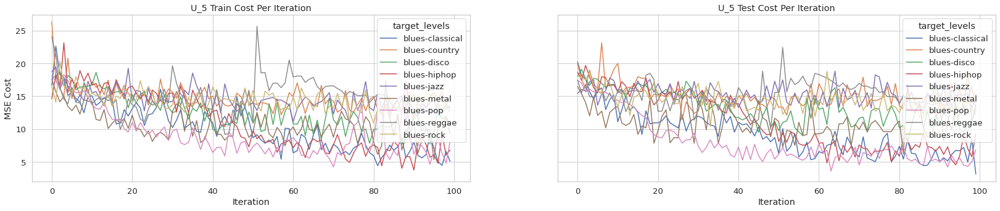

In [15]:
plot_loss(result_data, "circuit", "target_levels", ["blues"], figsize=(28, 5))

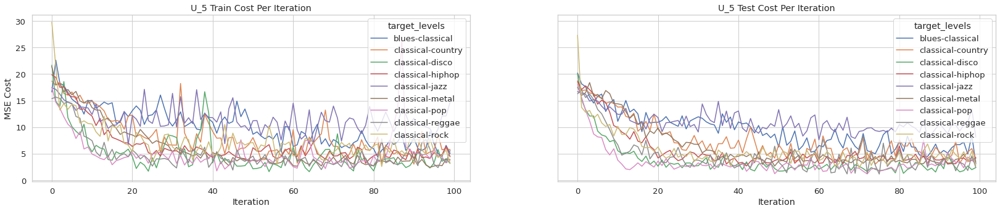

In [71]:
plot_loss(result_data, "circuit", "target_levels", ["classical"], figsize=(28, 5))

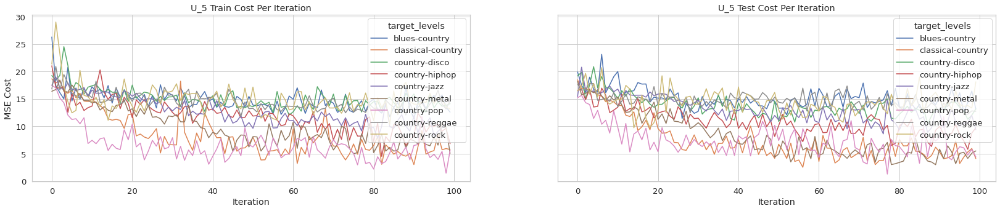

In [72]:
plot_loss(result_data, "circuit", "target_levels", ["country"], figsize=(28, 5))

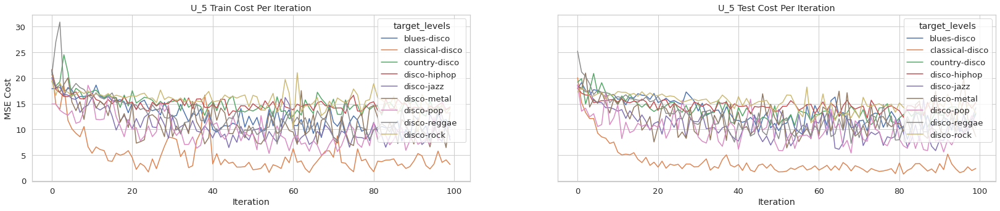

In [73]:
plot_loss(result_data, "circuit", "target_levels", ["disco"], figsize=(28, 5))

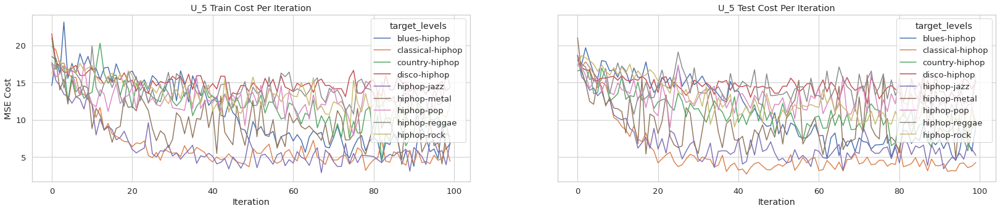

In [74]:
plot_loss(result_data, "circuit", "target_levels", ["hiphop"], figsize=(28, 5))

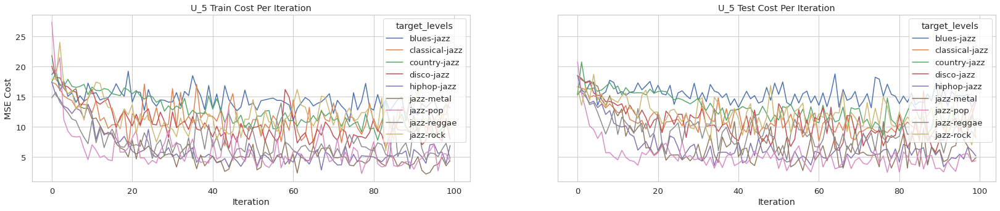

In [75]:
plot_loss(result_data, "circuit", "target_levels", ["jazz"], figsize=(28, 5))

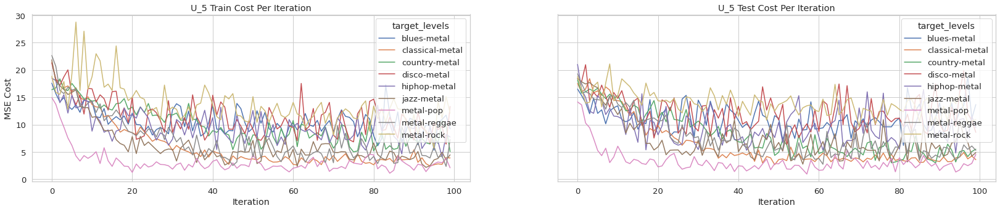

In [76]:
plot_loss(result_data, "circuit", "target_levels", ["metal"], figsize=(28, 5))

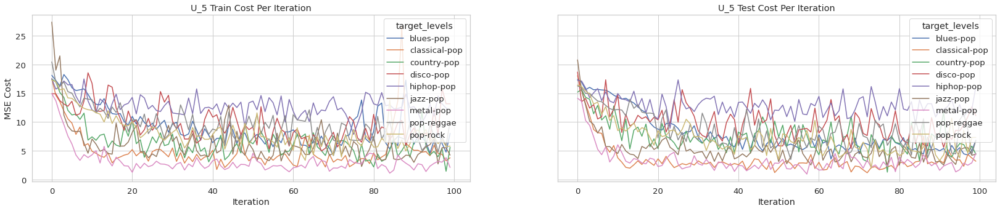

In [77]:
plot_loss(result_data, "circuit", "target_levels", ["pop"], figsize=(28, 5))

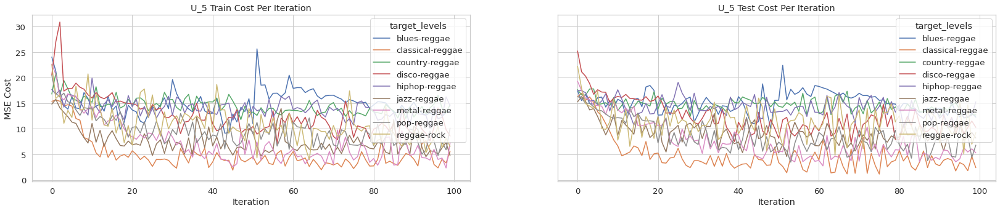

In [78]:
plot_loss(result_data, "circuit", "target_levels", ["reggae"], figsize=(28, 5))

### Embedding Per Circuit for amplitude encoding

In [33]:
# plot_loss(result_data, "circuit", "embedding_option", ["Amplitude"], figsize=(28, 5))

### Circuit Per Embedding 

In [35]:
plot_loss(result_data, "embedding_option", "circuit", figsize=(30, 5))

### Classical Model
#### Logistic Regression


In [465]:
# classes = ["pop", "classical"]
# classes = ["metal", "rock"]
classes = ["jazz", "disco"]
model_path = f"../results/pca-8-logreg-{'-'.join(classes)}-confusion-matrix.csv"

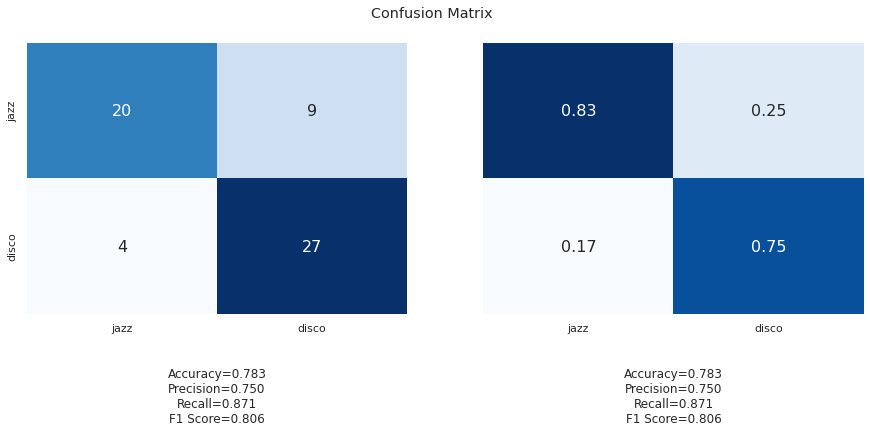

In [466]:
cf_matrix = pd.read_csv(model_path, index_col=0)
_, _, _, _, stats_text = confusion_matrix_stats(cf_matrix)
plot_confusion_matrix_nn(cf_matrix, classes, stats_text)

#### CNN

In [471]:
# 200 steps --- 0.8741238117218018 seconds ---
# 1000 steps --- 2.834665536880493 seconds ---
# 5000 steps --- 34.7819185256958 seconds --- (varies from 8 to 34)
# High variances with these models
# classes = ["classical", "pop"]
# classes = ["metal", "rock"]
# classes = ["jazz", "disco"]
steps = 200

model_path = f"../results/pca-8-cnn-{'-'.join(classes)}-{steps}-confusion-matrix.csv"
print(model_path)

../results/pca-8-cnn-jazz-disco-200-confusion-matrix.csv


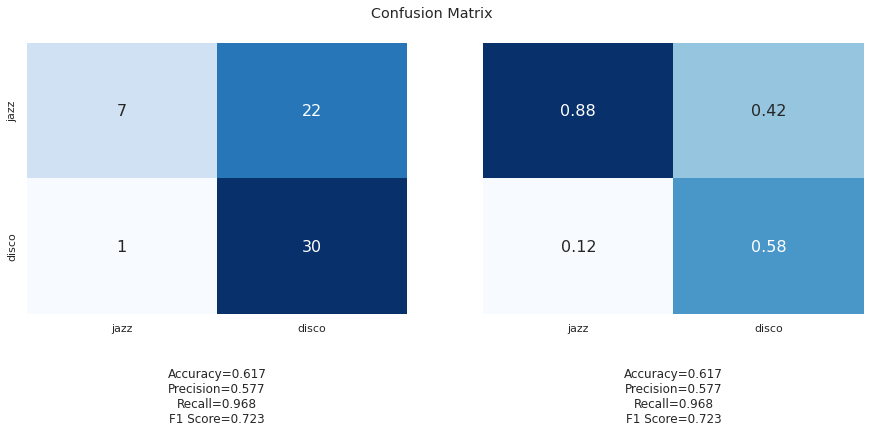

In [472]:
cf_matrix = pd.read_csv(model_path, index_col=0)
_, _, _, _, stats_text = confusion_matrix_stats(cf_matrix)
plot_confusion_matrix_nn(cf_matrix, classes, stats_text)

In [14]:
# Image(filename=f"../data/Data/images_original/classical/classical00020.png")

In [323]:
model_name = "pca-8-Angle-U_5"
data_path = "../data/archive/Data/features_30_sec.csv"
audio_path = "../data/archive/Data/genres_original"
target = "label"
classes = ["metal", "rock"]

In [324]:
experiment_id = 11
# f"{experiments_path}/{experiment_id}/"
# Load results
cf_matrix = pd.read_csv(
    f"{experiments_path}/{experiment_id}/{model_name}-confusion-matrix.csv", index_col=0
)
loss_history = pd.read_csv(
    f"{experiments_path}/{experiment_id}/{model_name}-loss-train-history.csv"
)
loss_test_history = pd.read_csv(
    f"{experiments_path}/{experiment_id}/{model_name}-loss-test-history.csv"
)
estimate_vs_class = pd.read_csv(
    f"{experiments_path}/{experiment_id}//{model_name}-yhat-class-vs-y-test.csv",
    index_col=0,
)
y_hat = pd.read_csv(
    f"{experiments_path}/{experiment_id}//{model_name}-yhat.csv", index_col=0
)

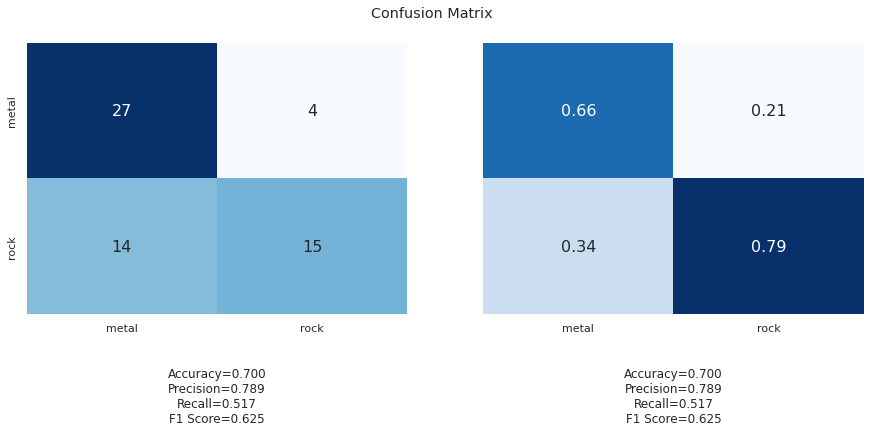

In [325]:
# Plot Confusion Matrix
_, _, _, _, stats_text = confusion_matrix_stats(cf_matrix)
plot_confusion_matrix_nn(cf_matrix, classes, stats_text)

In [326]:
y_hat

,0
0,0
1,0
2,0
3,1
4,1
5,0
6,0
7,1
8,0
9,1


In [327]:
loss_history.columns = ["Iteration", "Train_Cost"]
loss_test_history.columns = ["Iteration", "Test_Cost"]
loss_history = loss_history.set_index("Iteration")
loss_test_history = loss_test_history.set_index("Iteration")
loss_data = loss_history.join(loss_test_history, on="Iteration", how="left")
loss_data["Iteration"] = loss_data.index
plot_data = pd.melt(loss_data, "Iteration", value_name="MSE Cost", var_name="Sample")

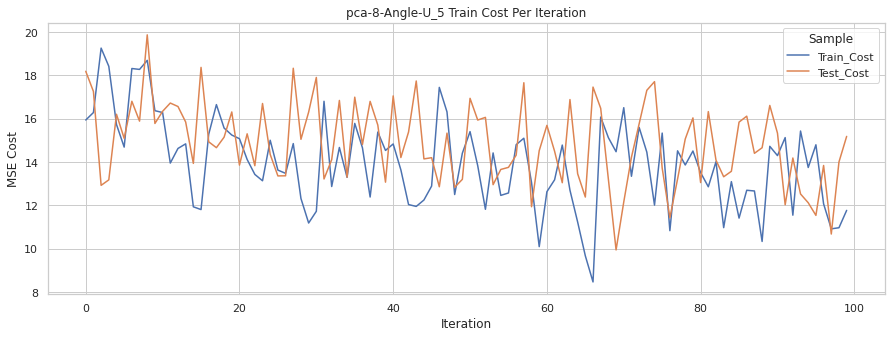

In [328]:
with sns.axes_style("whitegrid"):
    fig, axes = plt.subplots(1, 1, figsize=(15, 5))
    sns.lineplot(
        ax=axes,
        data=plot_data,
        x="Iteration",
        y="MSE Cost",
        hue="Sample",
        markers=True,
        dashes=False,
    )
    axes.set_title(f"{model_name} Train Cost Per Iteration")

In [333]:
Xy = pd.read_csv(data_path)

# returns "classical|pop" etc depending on class selection
filter_pat = "|".join(genre for genre in classes)
indices = Xy["filename"].str.contains(filter_pat)

# Select only data for relevant classes
Xy = Xy.loc[indices, :].copy()

X_train, y_train, X_test, y_test = load_image_data(data_path, classes, target)
estimate_vs_class.index = y_test.index
y_hat.index = y_test.index

In [341]:
# estimate_vs_class

In [334]:
TP, TN, FP, FN = get_tp_tn_lists(estimate_vs_class, y_test)

In [342]:
def get_rnd_audio_sample(data, class_type, target="label"):
    idx = data.loc[class_type[class_type == True].sample(1).index].index
    filename, genre = data.loc[idx, "filename"].iloc[0], data.loc[idx, target].iloc[0]
    return filename, genre


def plot_spectogram(audio_path, filename, genre):
    audio_ts, sample_rate = librosa.load(f"{audio_path}/{genre}/{filename}")
    X = librosa.stft(audio_ts)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(20, 10))
    librosa.display.specshow(Xdb, sr=sample_rate, x_axis="time", y_axis="log")
    plt.colorbar()

In [336]:
# certainty = np.sqrt((y_hat.iloc[:, 0] - y_hat.iloc[:, 1]) ** 2)
# min_certainty_key = np.where(min(certainty) == certainty)[0][0]
# idx = y_hat.iloc[uncertain_key, :].name

In [344]:
# filename, genre = Xy.loc[idx, "filename"], Xy.loc[idx, target]

In [75]:
print(f"Example of minmal certainty {filename} predicted as {genre}\n")
ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of minmal certainty pop.00037.wav predicted as pop



In [347]:
# plot_spectogram(audio_path, filename, genre)
# TP

In [348]:
filename, genre = get_rnd_audio_sample(Xy, TP)
# filename, genre = "classical.00029.wav", classes[1]
print(f"Example of true positive {filename} predicted as {classes[1]}\n")
ipd.Audio(f"{audio_path}/{genre}/{filename}")

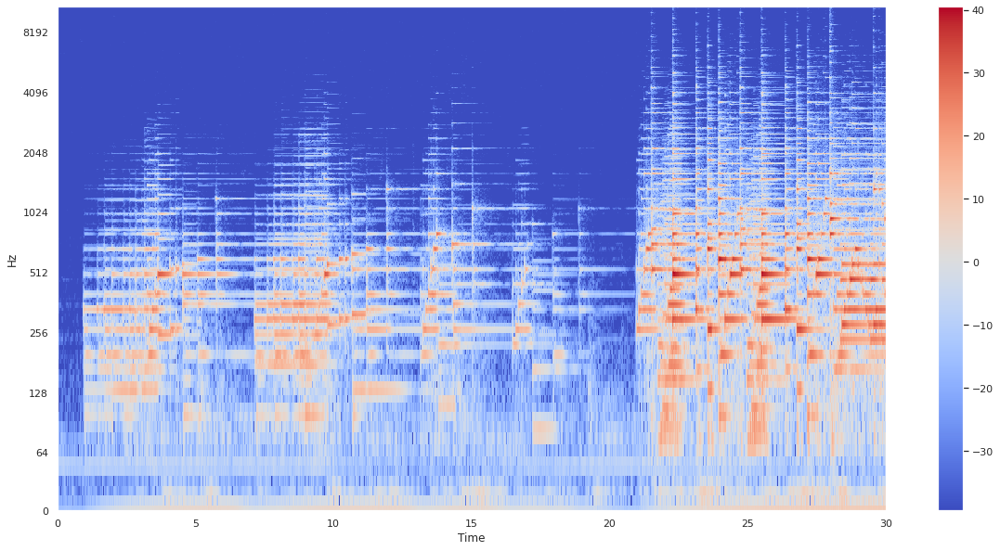

In [78]:
plot_spectogram(audio_path, filename, genre)

In [80]:
# filename, genre = get_rnd_audio_sample(Xy, FP)
filename, genre = "pop.00040.wav", classes[0]
print(f"Example of false positive {filename} model predicted {classes[1]}\n")
ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of false positive pop.00040.wav model predicted classical



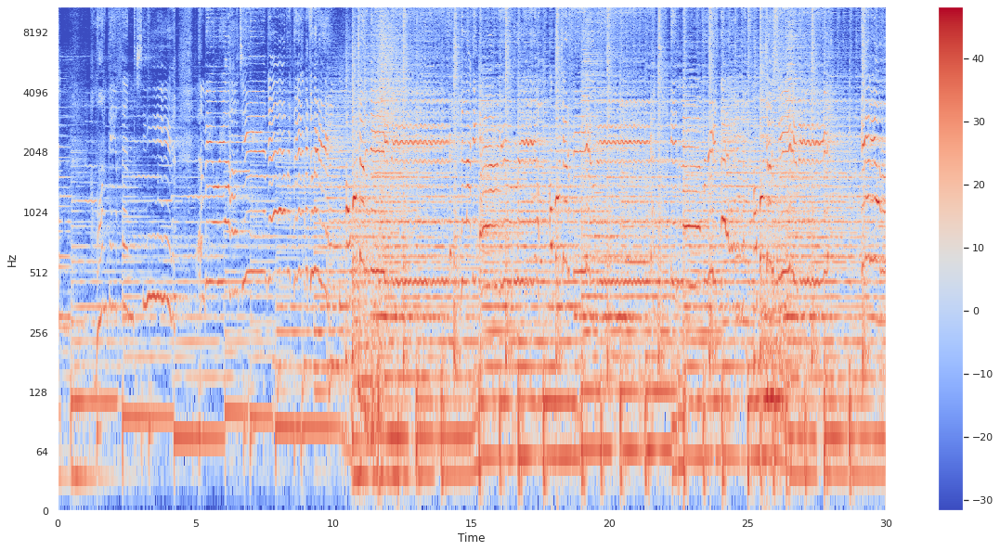

In [81]:
plot_spectogram(audio_path, filename, genre)

In [71]:
# filename, genre = get_rnd_audio_sample(Xy, FN)
filename, genre = "classical.00076.wav", classes[1]
print(f"Example of false negative {filename} predicted as {classes[0]}\n")

ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of false negative classical.00076.wav predicted as pop



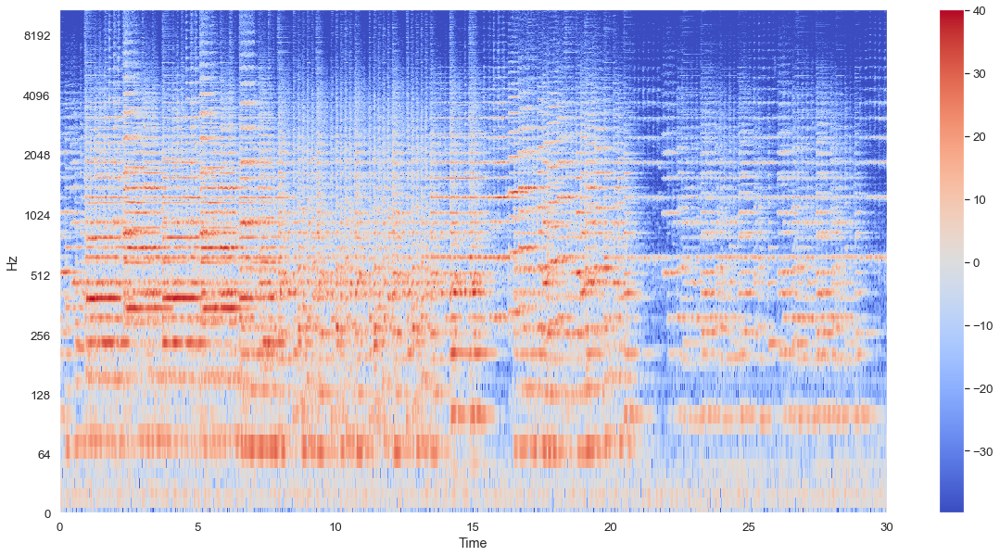

In [72]:
plot_spectogram(audio_path, filename, genre)

In [82]:
filename, genre = get_rnd_audio_sample(Xy, TN)
# filename, genre = "pop.00028.wav", classes[0]
print(f"Example of true negative {filename} predicted as {classes[0]}\n")
ipd.Audio(f"{audio_path}/{genre}/{filename}")

Example of true negative pop.00004.wav predicted as pop



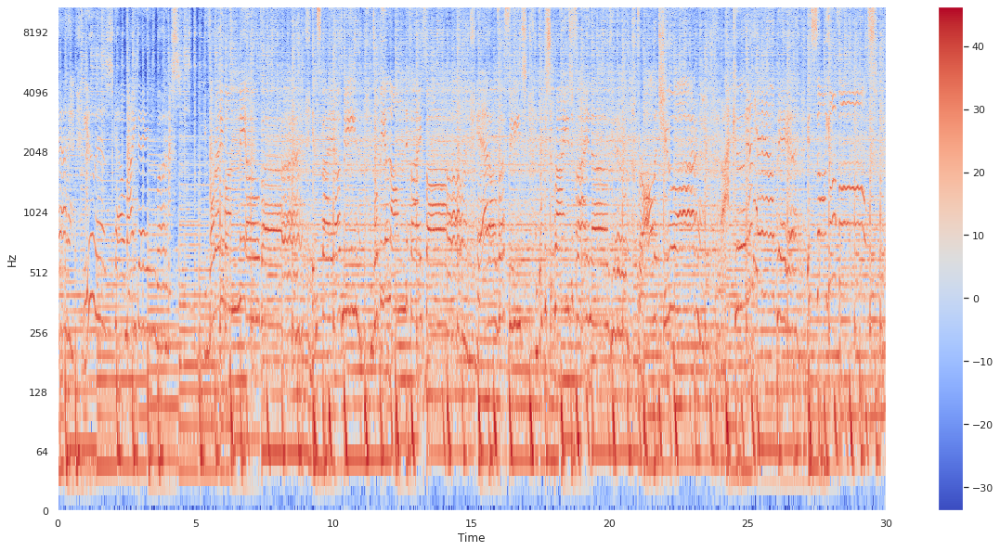

In [83]:
plot_spectogram(audio_path, filename, genre)

In [ ]:
# layer_dict = {
#     "c_1": Layer(c_1, getattr(circuit_presets, circ_name), "convolutional", circuit_options[circ_name], 0,),
#     "p_1": Layer(p_1, getattr(circuit_presets, "psatz1"), "pooling", pooling_options["psatz1"], 1,),
#     "c_2": Layer(c_2, getattr(circuit_presets, circ_name), "convolutional", circuit_options[circ_name], 2,),
#     "p_2": Layer(p_2, getattr(circuit_presets, "psatz1"), "pooling", pooling_options["psatz1"], 3,),
#     "c_3": Layer(c_3, getattr(circuit_presets, circ_name), "convolutional", circuit_options[circ_name], 4,),
#     "p_3": Layer(p_3, getattr(circuit_presets, "psatz1"), "pooling", pooling_options["psatz1"], 5,),
# }
# qcnn_structure = QcnnStructure(layer_dict)